# Deep Learning Lab - 5. GAN

In this lab, we’ll explore **Generative Adversarial Networks (GANs)**. GANs consist of two models:

* **Generator**: This model generates new data (in this case, images) from random noise.

* **Discriminator**: This model tries to distinguish between real data (images from the dataset) and fake data (generated by the generator).

The generator's goal is to fool the discriminator, while the discriminator is tasked with improving its ability to distinguish real from fake. Through this adversarial process, the generator gradually learns to produce more realistic images.

<div style="text-align: center;">
<img src="https://developer.ibm.com/developer/default/articles/generative-adversarial-networks-explained/images/GANs.jpg" alt="Image description" width="500" height="300">
</div>


## Step 0: Install dependencies
In this lab, we use [TensorFlow](https://www.tensorflow.org/). TensorFlow is an open-source platform developed by Google for machine learning and deep learning. if you are using Kaggle or Google Colab environment, you can use TensorFlow without installing that but if you want to run your code locally you can install Tensorflow by using the following command with pip:

In [1]:
#! pip install tensorflow==2.16.1

In [2]:
import tensorflow as tf
print(tf.version.VERSION)

2.16.1


## Step 1: Data Preparation
We load the MNIST dataset, which contains 28x28 grayscale images of handwritten digits. The dataset is normalized so that the pixel values lie between -1 and 1, a range that helps the neural network learn better.

In [3]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import time

# Load and normalize the MNIST dataset
(train_images, _), (_, _) = tf.keras.datasets.mnist.load_data()
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
train_images = (train_images - 127.5) / 127.5  # Normalize the images to [-1, 1]

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


The dataset is shuffled and batched to make the training process more efficient.

In [4]:
batch_size = 256
buffer_size = 60000
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(buffer_size).batch(batch_size)

## Step 2: Define the Model

### 2.1 Building the Generator Model
The generator takes random noise as input and tries to generate an image. The architecture starts with a fully connected layer, followed by upsampling layers that increase the spatial dimensions of the image.

In [5]:
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((7, 7, 256)))
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

The model begins with a dense layer that maps random noise to a 7x7 grid. Using transpose convolution layers, the generator upsamples this grid to the desired output size (28x28). The tanh activation ensures that the output pixel values lie between -1 and 1, as required by our normalized dataset.

In [6]:
generator = build_generator()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### 2.2 Building the Discriminator Model
The discriminator is a convolutional neural network that classifies images as real or fake. It extracts features using convolutional layers and outputs a single scalar value indicating whether the input image is real or generated.

In [7]:
def build_discriminator():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [8]:
discriminator = build_discriminator()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## Step 3: Define Loss Functions and Optimizers

We use separate loss functions for the generator and discriminator:

* The **discriminator loss** measures its ability to distinguish real images from fake ones.

* The **generator loss** measures how well the generator is able to fool the discriminator.

In [9]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)


We use the **Adam optimizer** for both models as it performs well in practice for deep learning.

In [10]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Step 4: Train the Model

Now, we define how the GAN should be trained. In each step, the discriminator is trained to distinguish real images from fake ones, and the generator is trained to fool the discriminator.

In [11]:
def train_step(images):
    noise = tf.random.normal([batch_size, 100])

    # Record the gradients with respect to the generator and discriminator models
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

### Step 5: Visualize Generated Images
To evaluate the progress of the generator, we generate and save images after each epoch. This will help us visually track how well the generator is learning over time.

In [12]:
def show_generated_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    plt.show()

### Step 6. Train the Model
Finally, we run the training process and observe how the generator improves over time.

In [13]:
epochs = 200
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [14]:
def train_and_show_progress(dataset, epochs):
    for epoch in range(epochs):
        g_loss = 0
        d_loss = 0

        for image_batch in dataset:
            g_batch_loss, d_batch_loss = train_step(image_batch)
            
            g_loss += g_batch_loss
            d_loss += d_batch_loss
            

        print(f'Loss in epoch {epoch + 1}: Generator = {g_loss} , Discriminator = {d_loss} ')
        show_generated_images(generator, epoch + 1, seed)

Loss in epoch 1: Generator = 170.8595733642578 , Discriminator = 252.53488159179688 


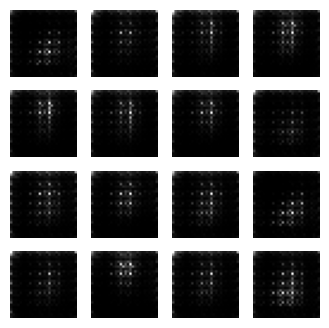

Loss in epoch 2: Generator = 185.0579376220703 , Discriminator = 307.0166015625 


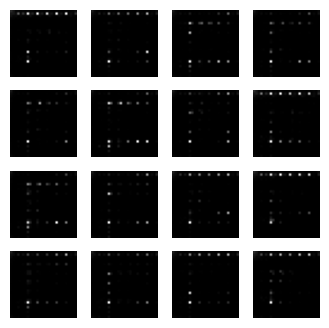

Loss in epoch 3: Generator = 209.76983642578125 , Discriminator = 285.34979248046875 


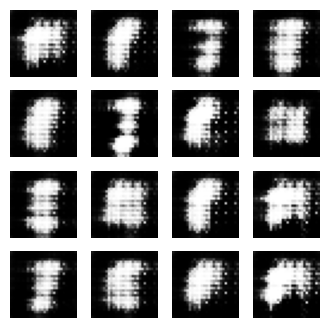

Loss in epoch 4: Generator = 212.3265380859375 , Discriminator = 280.07958984375 


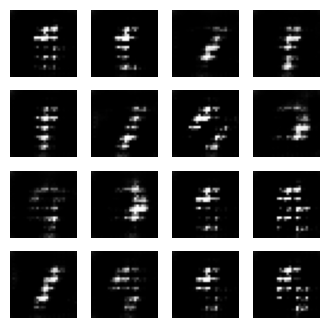

Loss in epoch 5: Generator = 203.63685607910156 , Discriminator = 285.5140686035156 


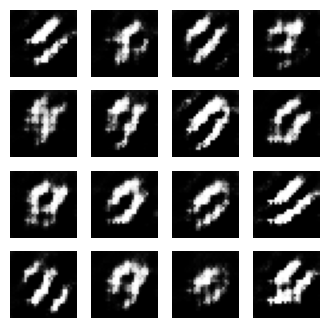

Loss in epoch 6: Generator = 201.93826293945312 , Discriminator = 296.2861022949219 


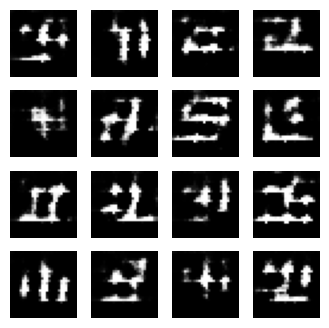

Loss in epoch 7: Generator = 213.20484924316406 , Discriminator = 289.2494201660156 


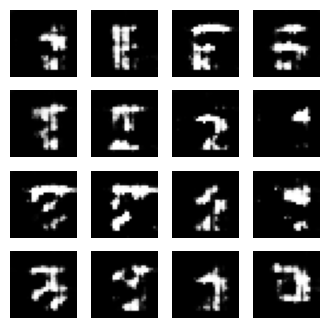

Loss in epoch 8: Generator = 225.2480010986328 , Discriminator = 281.1330261230469 


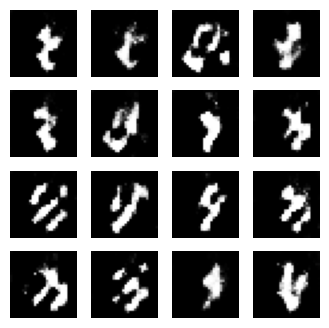

Loss in epoch 9: Generator = 199.78846740722656 , Discriminator = 313.77862548828125 


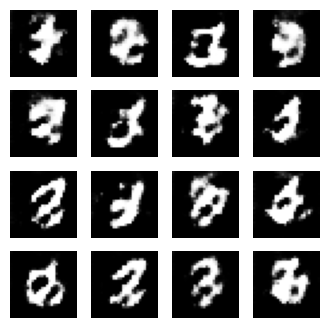

Loss in epoch 10: Generator = 204.03677368164062 , Discriminator = 296.97808837890625 


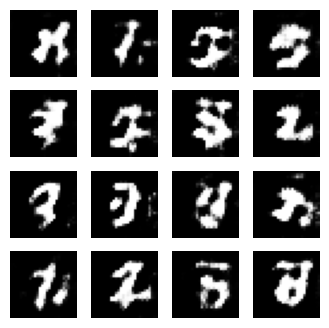

Loss in epoch 11: Generator = 214.45526123046875 , Discriminator = 288.2045593261719 


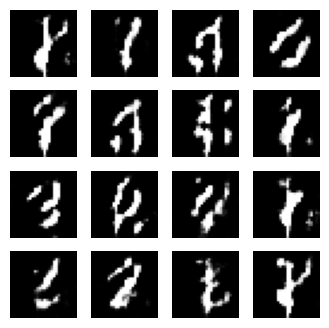

Loss in epoch 12: Generator = 238.14044189453125 , Discriminator = 266.67608642578125 


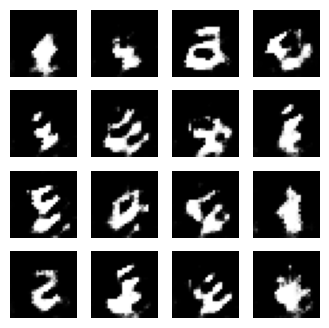

Loss in epoch 13: Generator = 253.2916259765625 , Discriminator = 262.7453308105469 


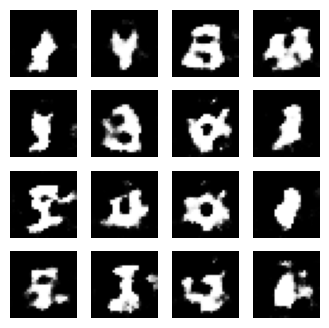

Loss in epoch 14: Generator = 256.0914306640625 , Discriminator = 267.5494689941406 


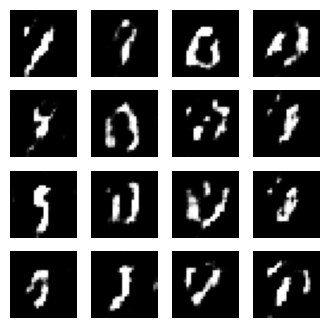

Loss in epoch 15: Generator = 241.66156005859375 , Discriminator = 271.4413146972656 


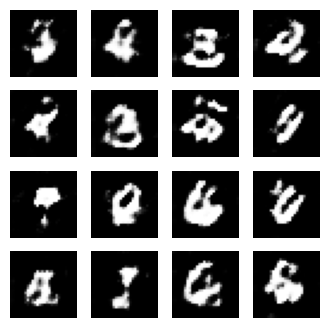

Loss in epoch 16: Generator = 283.6570129394531 , Discriminator = 237.98782348632812 


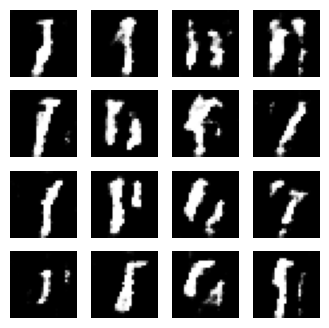

Loss in epoch 17: Generator = 272.5029602050781 , Discriminator = 259.6540832519531 


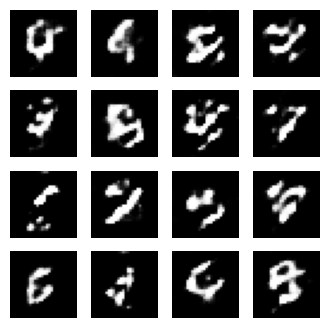

Loss in epoch 18: Generator = 301.3994140625 , Discriminator = 237.75257873535156 


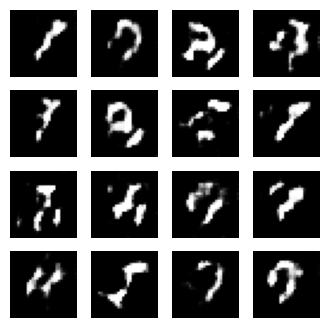

Loss in epoch 19: Generator = 289.4460144042969 , Discriminator = 243.00042724609375 


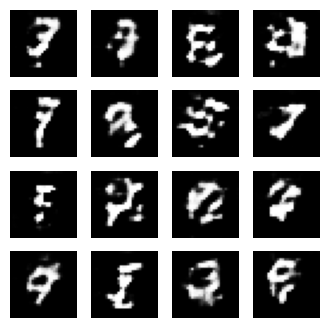

Loss in epoch 20: Generator = 309.9000244140625 , Discriminator = 225.2061004638672 


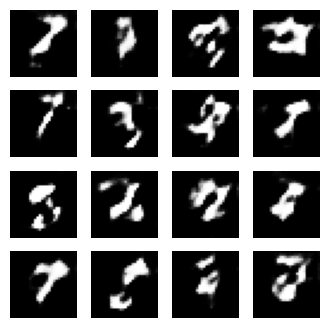

Loss in epoch 21: Generator = 300.8675231933594 , Discriminator = 232.50619506835938 


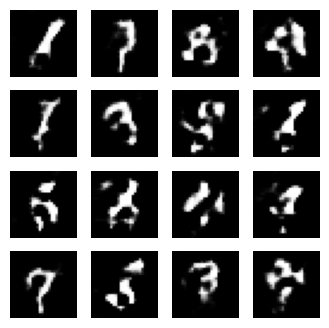

Loss in epoch 22: Generator = 309.022705078125 , Discriminator = 227.5416259765625 


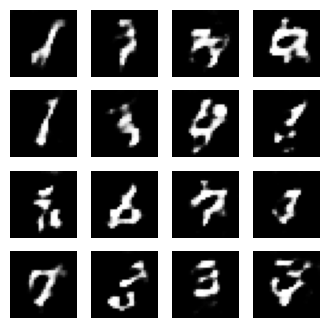

Loss in epoch 23: Generator = 300.951171875 , Discriminator = 236.35560607910156 


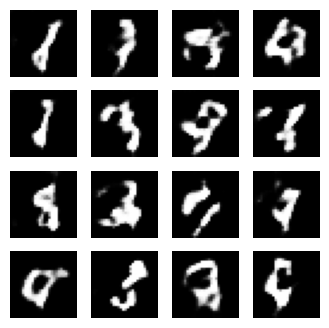

Loss in epoch 24: Generator = 304.0746765136719 , Discriminator = 239.48646545410156 


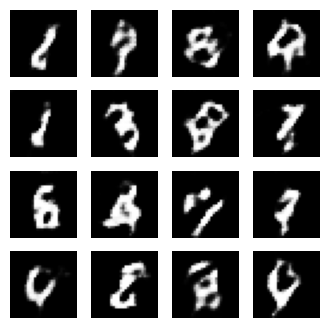

Loss in epoch 25: Generator = 304.8238525390625 , Discriminator = 232.57864379882812 


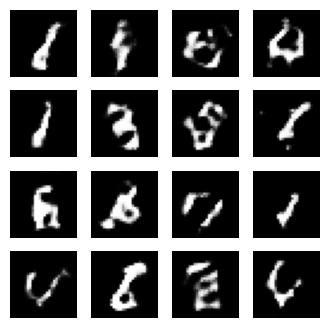

Loss in epoch 26: Generator = 302.46856689453125 , Discriminator = 246.04672241210938 


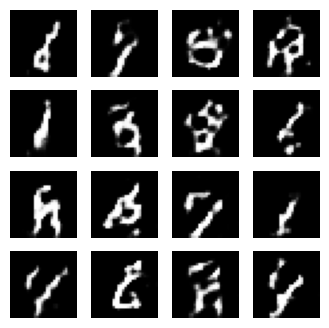

Loss in epoch 27: Generator = 318.9493103027344 , Discriminator = 239.49176025390625 


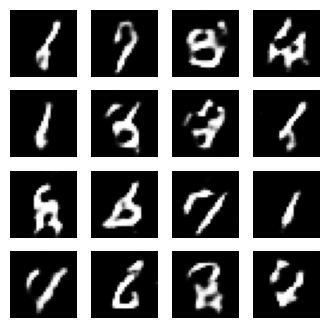

Loss in epoch 28: Generator = 290.2327880859375 , Discriminator = 246.32887268066406 


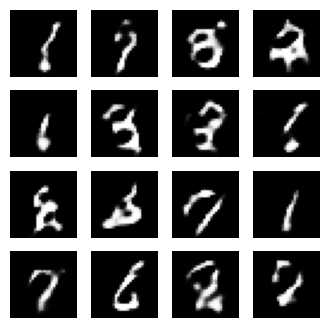

Loss in epoch 29: Generator = 279.4190673828125 , Discriminator = 254.8944549560547 


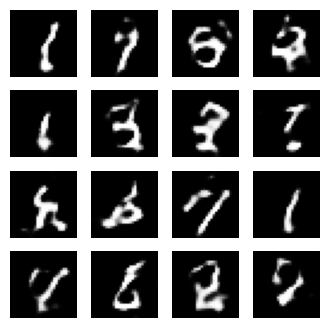

Loss in epoch 30: Generator = 268.4963073730469 , Discriminator = 265.2927551269531 


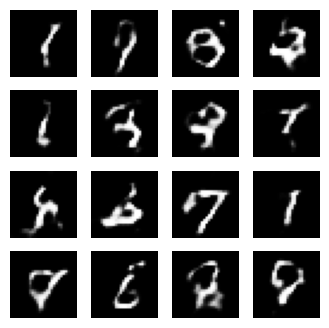

Loss in epoch 31: Generator = 270.2228088378906 , Discriminator = 262.3487548828125 


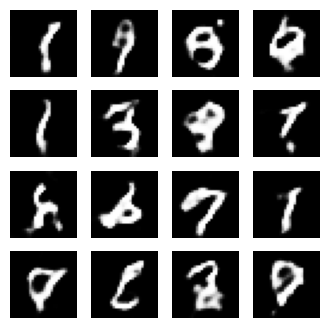

Loss in epoch 32: Generator = 267.29046630859375 , Discriminator = 271.0875244140625 


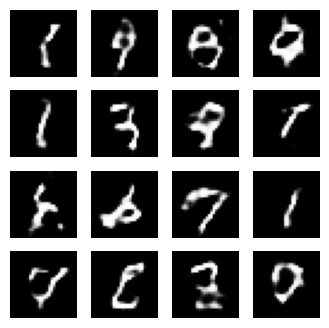

Loss in epoch 33: Generator = 257.4063720703125 , Discriminator = 274.0029296875 


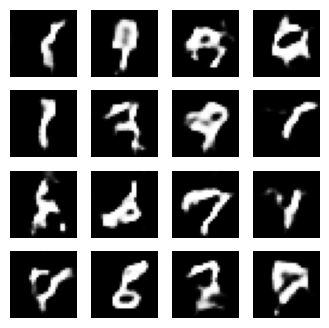

Loss in epoch 34: Generator = 258.3359680175781 , Discriminator = 273.9517517089844 


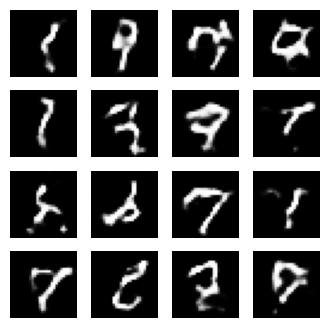

Loss in epoch 35: Generator = 249.99520874023438 , Discriminator = 278.17498779296875 


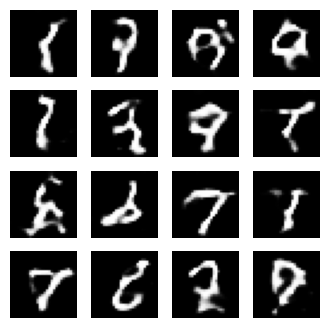

Loss in epoch 36: Generator = 238.97642517089844 , Discriminator = 279.75408935546875 


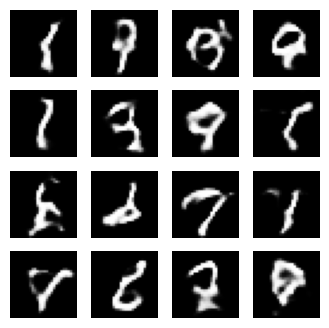

Loss in epoch 37: Generator = 234.49932861328125 , Discriminator = 280.616455078125 


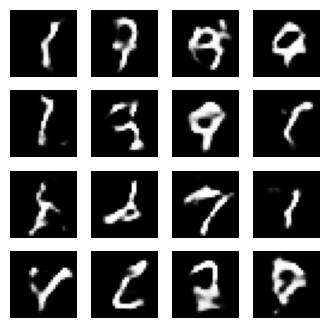

Loss in epoch 38: Generator = 240.809814453125 , Discriminator = 279.946533203125 


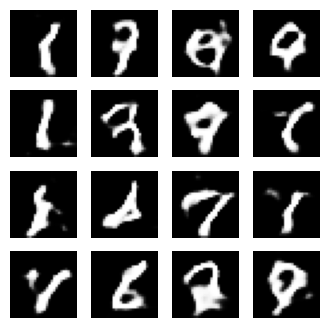

Loss in epoch 39: Generator = 263.7920227050781 , Discriminator = 274.4989318847656 


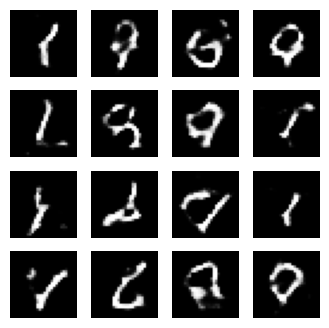

Loss in epoch 40: Generator = 255.29693603515625 , Discriminator = 273.30999755859375 


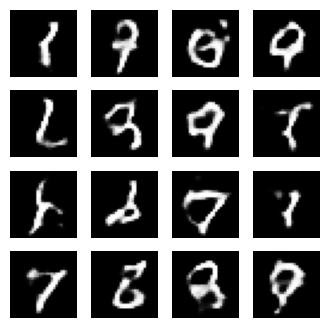

Loss in epoch 41: Generator = 233.41409301757812 , Discriminator = 285.5930480957031 


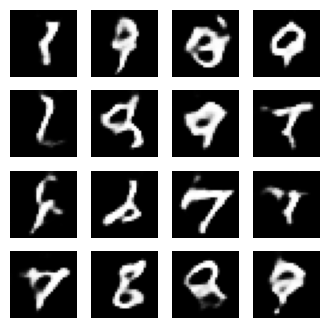

Loss in epoch 42: Generator = 234.45089721679688 , Discriminator = 285.0535888671875 


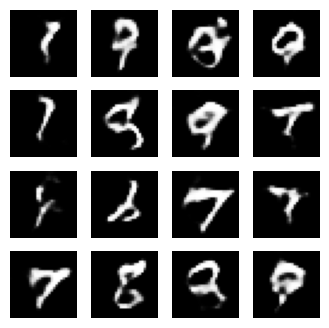

Loss in epoch 43: Generator = 238.8675537109375 , Discriminator = 283.7344970703125 


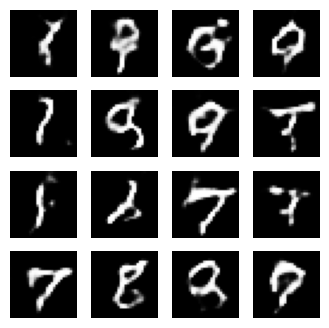

Loss in epoch 44: Generator = 238.71148681640625 , Discriminator = 279.3230895996094 


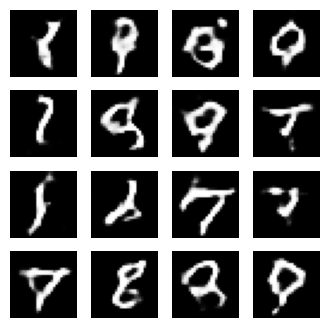

Loss in epoch 45: Generator = 233.11163330078125 , Discriminator = 284.90191650390625 


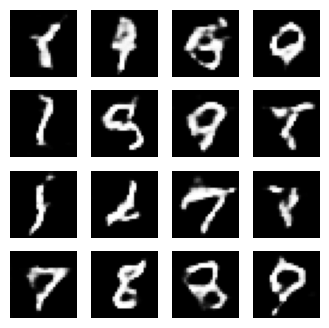

Loss in epoch 46: Generator = 235.08306884765625 , Discriminator = 285.0003967285156 


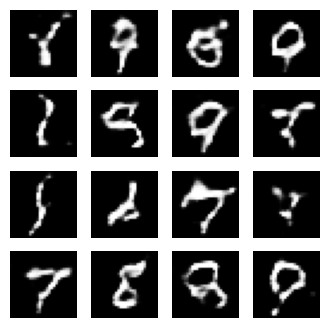

Loss in epoch 47: Generator = 227.8470458984375 , Discriminator = 284.8830261230469 


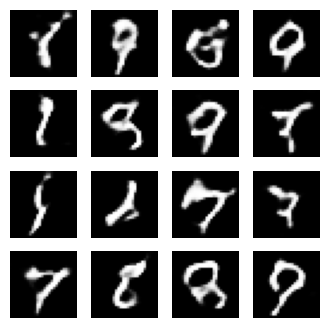

Loss in epoch 48: Generator = 223.3290557861328 , Discriminator = 287.9462585449219 


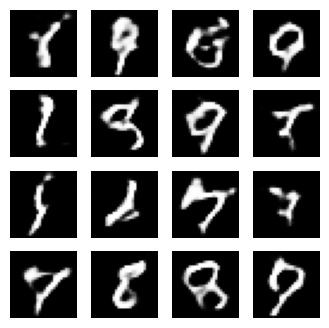

Loss in epoch 49: Generator = 222.99278259277344 , Discriminator = 285.44659423828125 


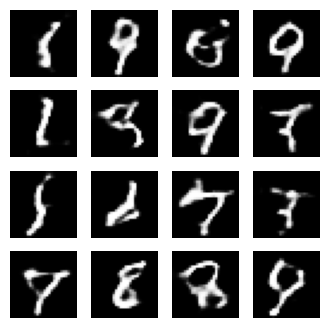

Loss in epoch 50: Generator = 227.16387939453125 , Discriminator = 285.1234436035156 


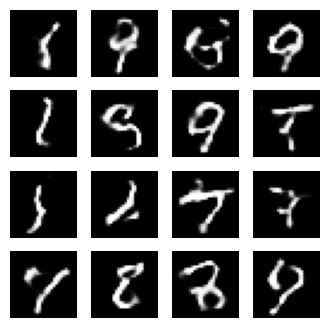

Loss in epoch 51: Generator = 239.72003173828125 , Discriminator = 282.52825927734375 


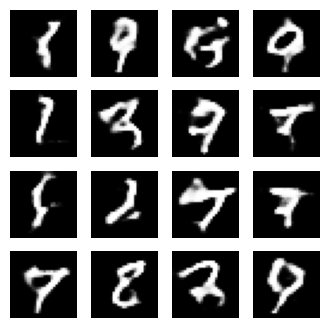

Loss in epoch 52: Generator = 238.79148864746094 , Discriminator = 282.14105224609375 


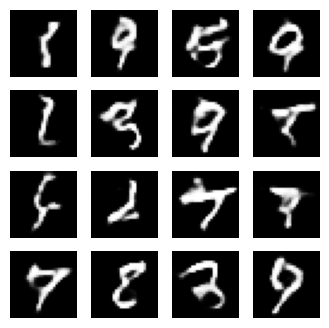

Loss in epoch 53: Generator = 238.5367889404297 , Discriminator = 283.3944396972656 


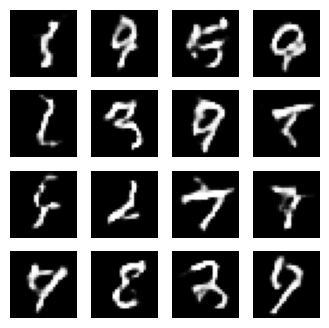

Loss in epoch 54: Generator = 237.4041290283203 , Discriminator = 281.0157470703125 


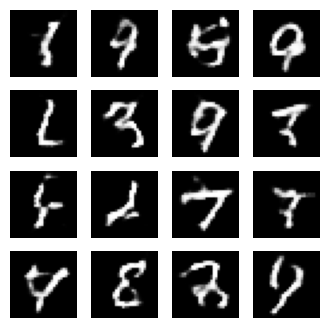

Loss in epoch 55: Generator = 235.72265625 , Discriminator = 281.1612548828125 


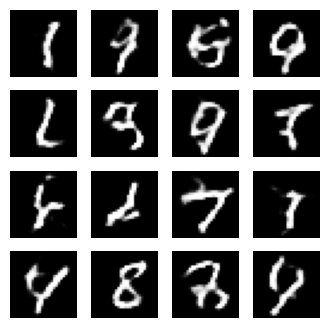

Loss in epoch 56: Generator = 232.35801696777344 , Discriminator = 284.5382385253906 


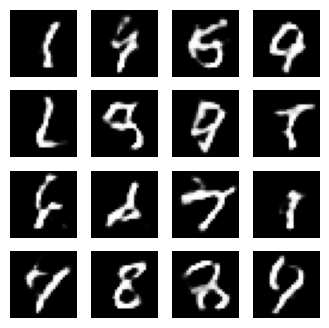

Loss in epoch 57: Generator = 227.64842224121094 , Discriminator = 283.6797180175781 


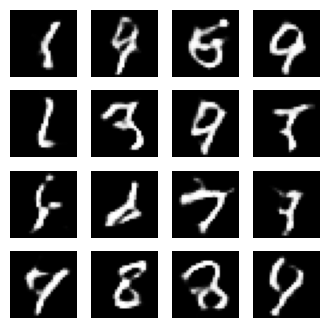

Loss in epoch 58: Generator = 221.2657928466797 , Discriminator = 286.4705810546875 


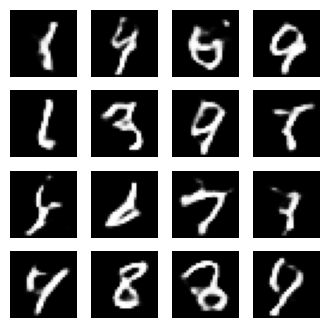

Loss in epoch 59: Generator = 223.5738983154297 , Discriminator = 287.47674560546875 


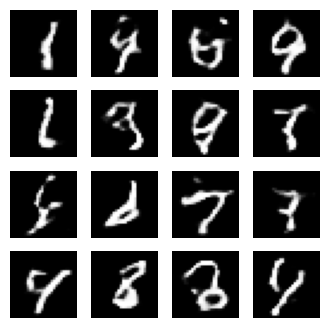

Loss in epoch 60: Generator = 231.149658203125 , Discriminator = 287.3038635253906 


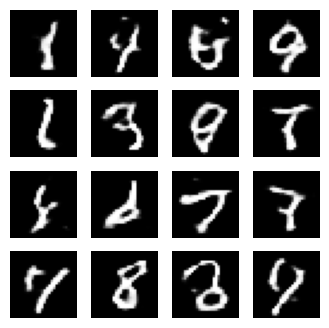

Loss in epoch 64: Generator = 225.81832885742188 , Discriminator = 285.43133544921875 


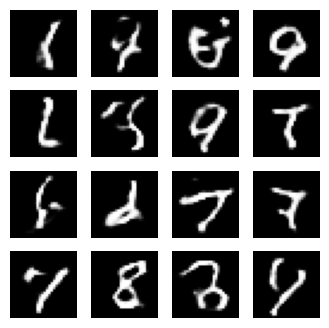

Loss in epoch 65: Generator = 224.4043426513672 , Discriminator = 287.62811279296875 


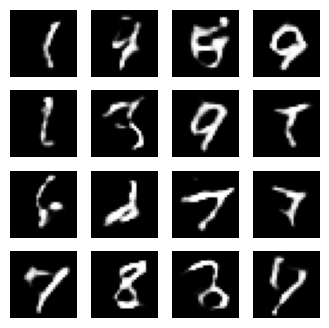

Loss in epoch 66: Generator = 237.8217010498047 , Discriminator = 281.8915100097656 


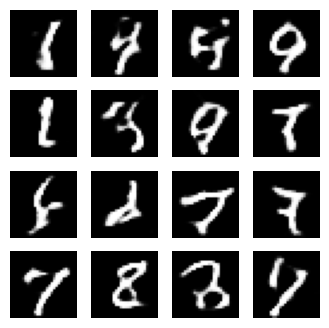

Loss in epoch 67: Generator = 226.91323852539062 , Discriminator = 288.7389221191406 


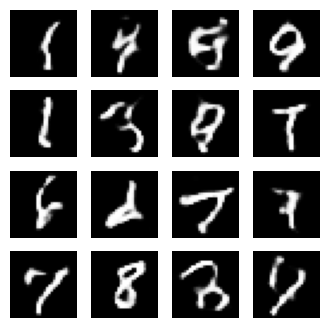

Loss in epoch 68: Generator = 219.49066162109375 , Discriminator = 288.5419006347656 


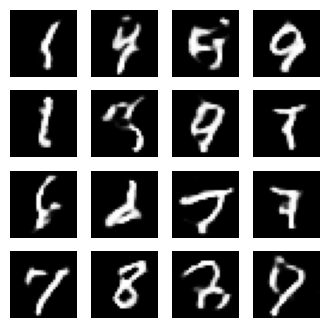

Loss in epoch 69: Generator = 216.0225830078125 , Discriminator = 290.41802978515625 


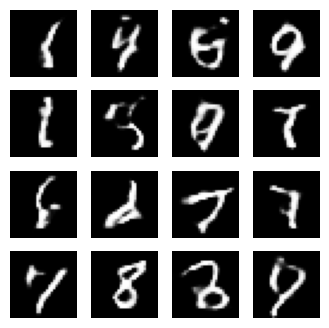

Loss in epoch 70: Generator = 219.8910369873047 , Discriminator = 289.41094970703125 


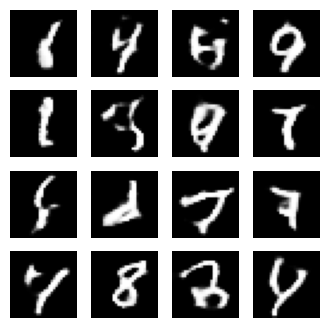

Loss in epoch 71: Generator = 236.8466796875 , Discriminator = 284.9996643066406 


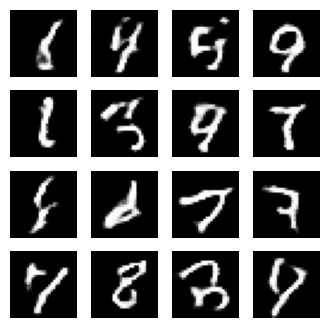

Loss in epoch 72: Generator = 233.07559204101562 , Discriminator = 286.3194580078125 


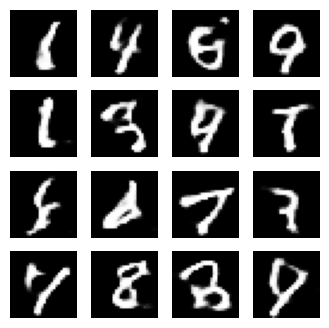

Loss in epoch 73: Generator = 232.01051330566406 , Discriminator = 284.6908874511719 


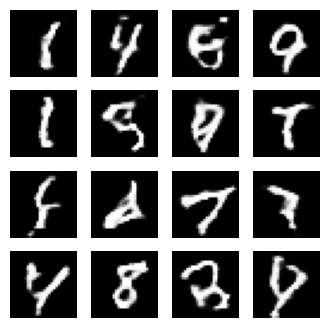

Loss in epoch 74: Generator = 227.8128662109375 , Discriminator = 286.6510009765625 


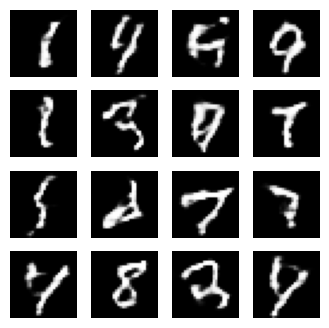

Loss in epoch 75: Generator = 230.33084106445312 , Discriminator = 286.8548278808594 


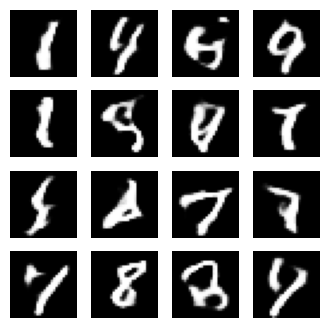

Loss in epoch 76: Generator = 229.31222534179688 , Discriminator = 285.47113037109375 


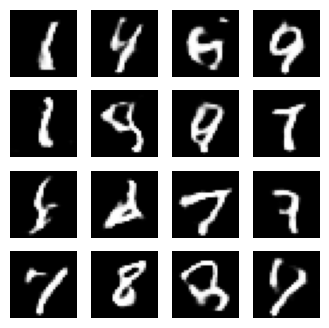

Loss in epoch 77: Generator = 221.40533447265625 , Discriminator = 292.4022521972656 


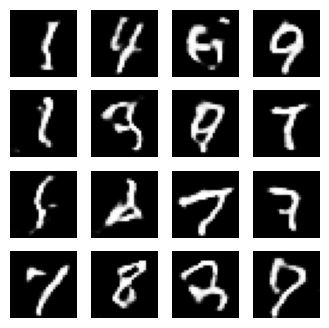

Loss in epoch 78: Generator = 219.23789978027344 , Discriminator = 290.2692565917969 


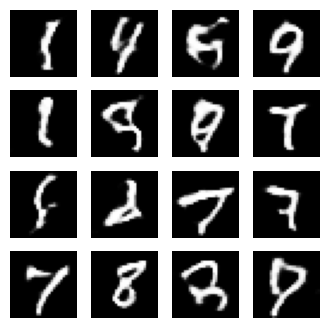

Loss in epoch 79: Generator = 220.25465393066406 , Discriminator = 289.36773681640625 


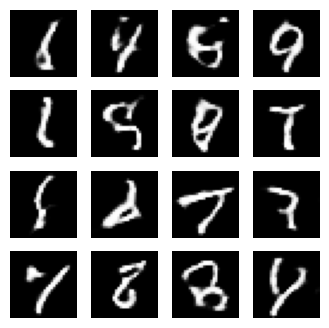

Loss in epoch 80: Generator = 224.42918395996094 , Discriminator = 293.1772766113281 


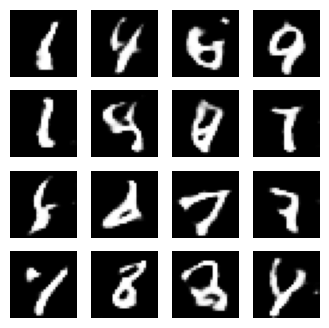

Loss in epoch 81: Generator = 229.2512969970703 , Discriminator = 285.94049072265625 


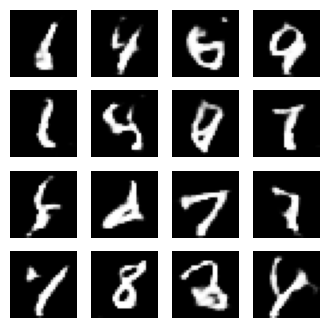

Loss in epoch 82: Generator = 231.98899841308594 , Discriminator = 285.7387390136719 


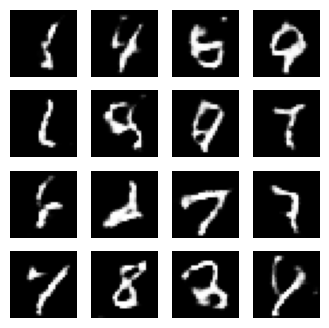

Loss in epoch 83: Generator = 231.57122802734375 , Discriminator = 286.73779296875 


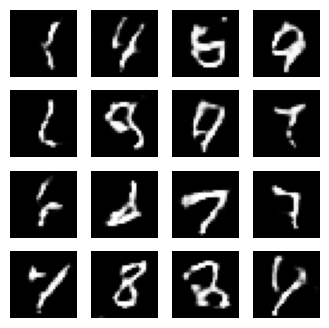

Loss in epoch 84: Generator = 229.55364990234375 , Discriminator = 287.6387939453125 


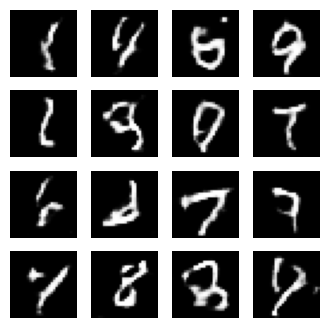

Loss in epoch 85: Generator = 220.09971618652344 , Discriminator = 289.2529296875 


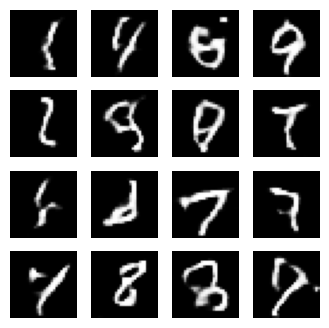

Loss in epoch 86: Generator = 218.60707092285156 , Discriminator = 290.24859619140625 


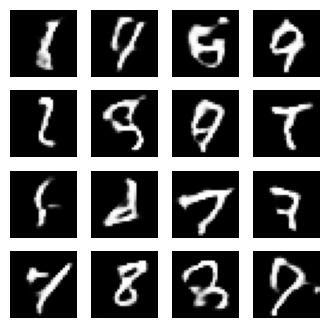

Loss in epoch 87: Generator = 218.3411407470703 , Discriminator = 292.3681945800781 


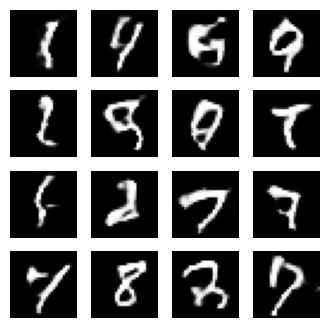

Loss in epoch 88: Generator = 225.0107879638672 , Discriminator = 288.4037170410156 


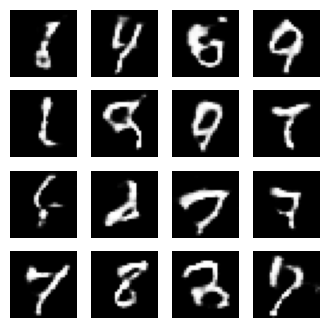

Loss in epoch 89: Generator = 231.13682556152344 , Discriminator = 286.575927734375 


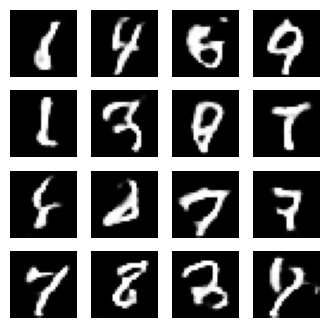

Loss in epoch 90: Generator = 227.2206268310547 , Discriminator = 287.67779541015625 


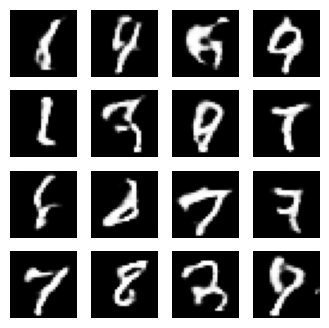

Loss in epoch 91: Generator = 223.9073486328125 , Discriminator = 291.90948486328125 


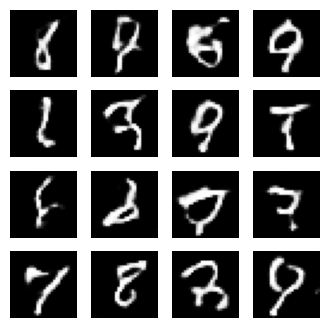

Loss in epoch 92: Generator = 230.14088439941406 , Discriminator = 288.4459228515625 


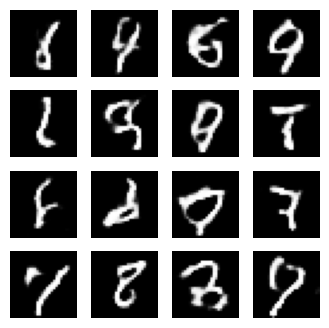

Loss in epoch 93: Generator = 225.5401611328125 , Discriminator = 289.89208984375 


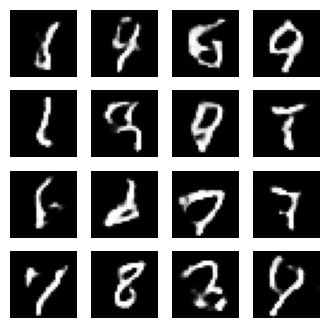

Loss in epoch 94: Generator = 227.9718780517578 , Discriminator = 285.470947265625 


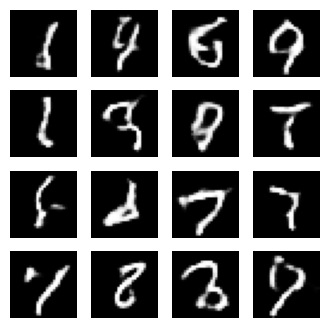

Loss in epoch 95: Generator = 222.56430053710938 , Discriminator = 291.54193115234375 


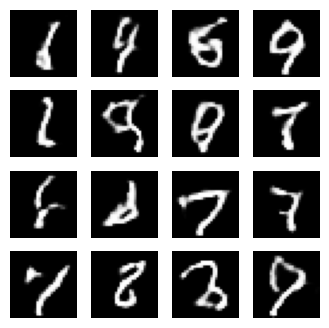

Loss in epoch 96: Generator = 222.72178649902344 , Discriminator = 289.1171875 


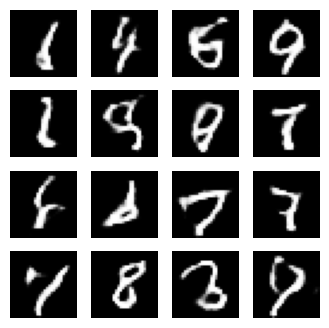

Loss in epoch 97: Generator = 218.15379333496094 , Discriminator = 291.9279479980469 


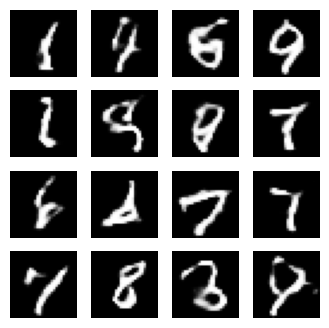

Loss in epoch 98: Generator = 219.02975463867188 , Discriminator = 290.1509704589844 


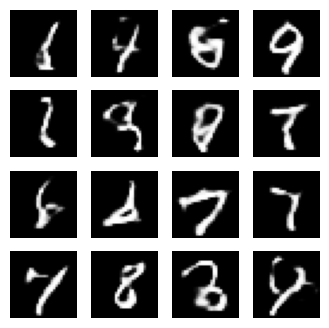

Loss in epoch 99: Generator = 216.83103942871094 , Discriminator = 292.5972900390625 


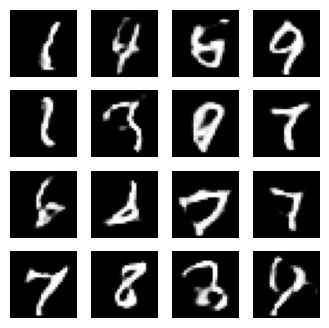

Loss in epoch 100: Generator = 222.78475952148438 , Discriminator = 292.1274108886719 


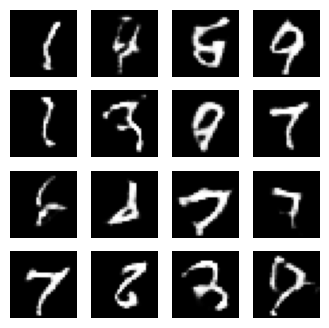

Loss in epoch 101: Generator = 221.35826110839844 , Discriminator = 289.99462890625 


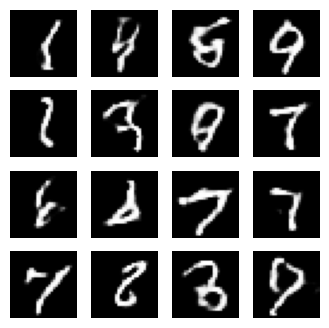

Loss in epoch 102: Generator = 221.8994140625 , Discriminator = 291.727294921875 


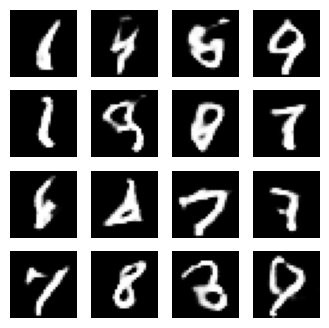

Loss in epoch 103: Generator = 227.34617614746094 , Discriminator = 289.37078857421875 


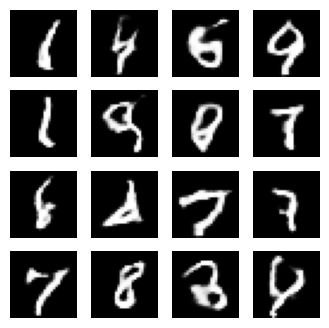

Loss in epoch 104: Generator = 220.50213623046875 , Discriminator = 291.24176025390625 


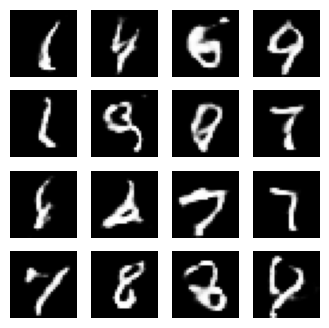

Loss in epoch 105: Generator = 220.70668029785156 , Discriminator = 290.6089172363281 


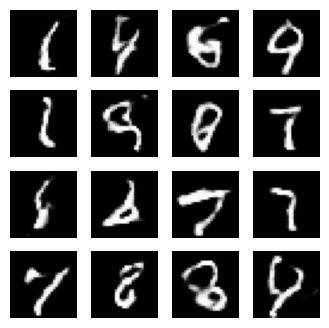

Loss in epoch 106: Generator = 223.91421508789062 , Discriminator = 289.80242919921875 


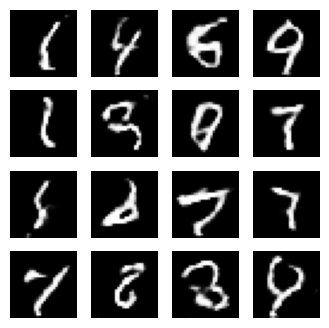

Loss in epoch 107: Generator = 220.40660095214844 , Discriminator = 293.15338134765625 


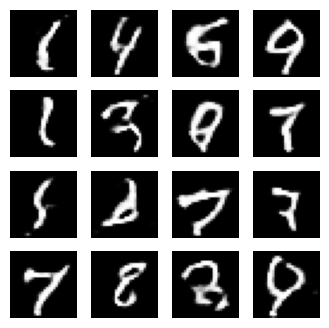

Loss in epoch 108: Generator = 219.57962036132812 , Discriminator = 291.5362854003906 


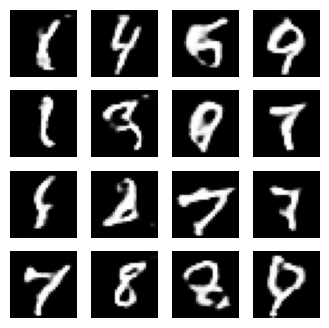

Loss in epoch 109: Generator = 218.87245178222656 , Discriminator = 291.72314453125 


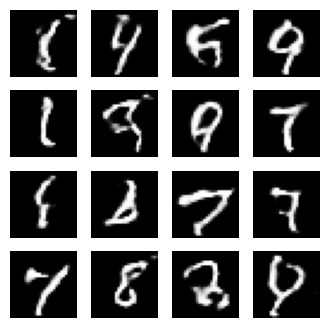

Loss in epoch 110: Generator = 220.9492645263672 , Discriminator = 294.41162109375 


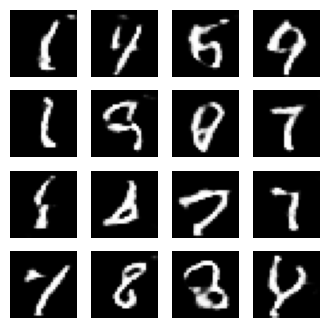

Loss in epoch 111: Generator = 222.40968322753906 , Discriminator = 290.4091491699219 


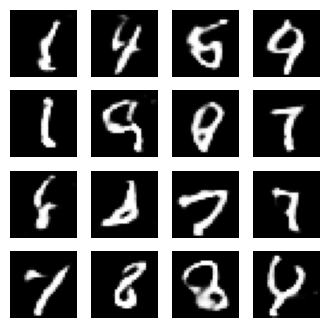

Loss in epoch 112: Generator = 217.93418884277344 , Discriminator = 291.19842529296875 


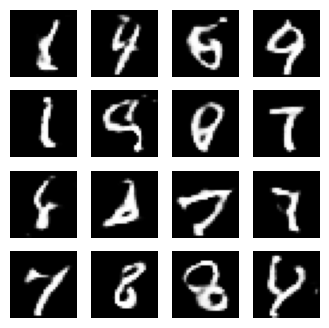

Loss in epoch 113: Generator = 219.53445434570312 , Discriminator = 293.35260009765625 


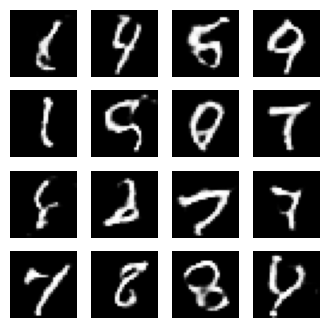

Loss in epoch 114: Generator = 219.6466064453125 , Discriminator = 291.6387023925781 


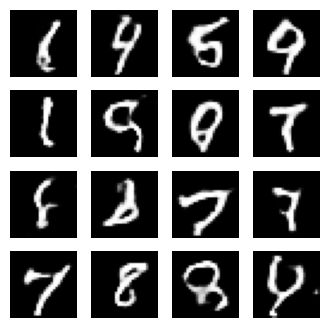

Loss in epoch 115: Generator = 215.546142578125 , Discriminator = 293.13580322265625 


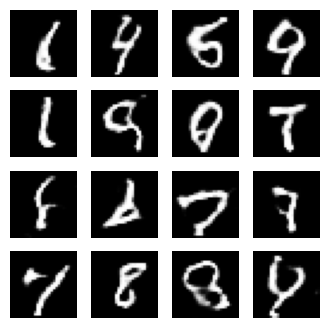

Loss in epoch 116: Generator = 217.3491973876953 , Discriminator = 295.1643981933594 


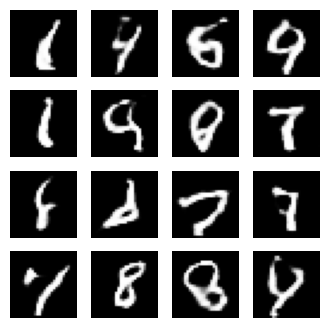

Loss in epoch 117: Generator = 221.62513732910156 , Discriminator = 291.90936279296875 


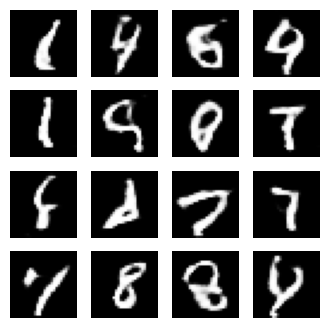

Loss in epoch 118: Generator = 224.98240661621094 , Discriminator = 290.2666015625 


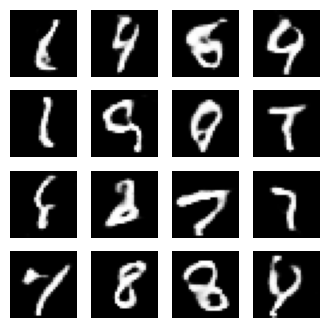

Loss in epoch 119: Generator = 213.2251434326172 , Discriminator = 296.25244140625 


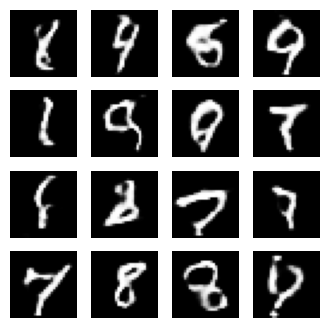

Loss in epoch 120: Generator = 215.06240844726562 , Discriminator = 292.8558044433594 


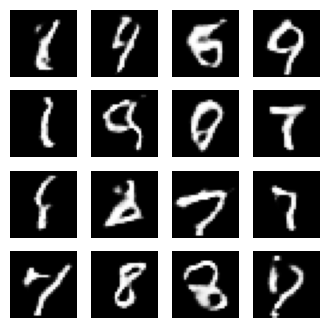

Loss in epoch 121: Generator = 213.5769500732422 , Discriminator = 295.301513671875 


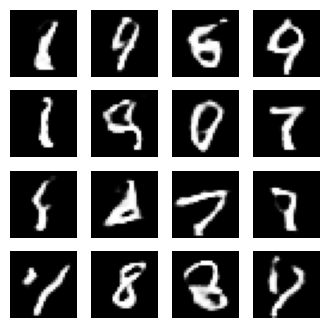

Loss in epoch 122: Generator = 214.7659912109375 , Discriminator = 294.00823974609375 


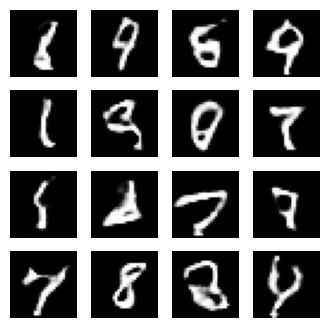

Loss in epoch 123: Generator = 212.52090454101562 , Discriminator = 295.96575927734375 


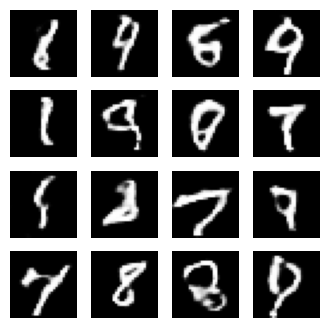

Loss in epoch 124: Generator = 220.94178771972656 , Discriminator = 291.1274108886719 


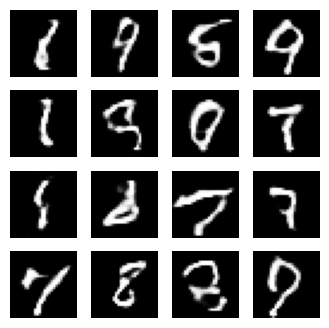

Loss in epoch 125: Generator = 227.62738037109375 , Discriminator = 293.0628356933594 


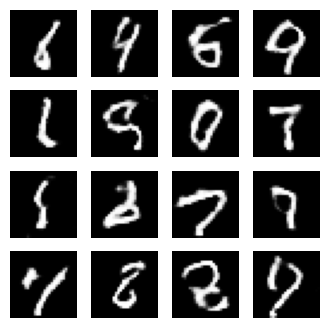

Loss in epoch 126: Generator = 221.37855529785156 , Discriminator = 294.40216064453125 


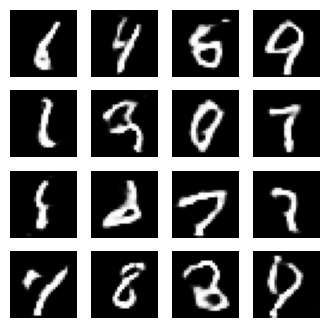

Loss in epoch 127: Generator = 220.4716033935547 , Discriminator = 291.843505859375 


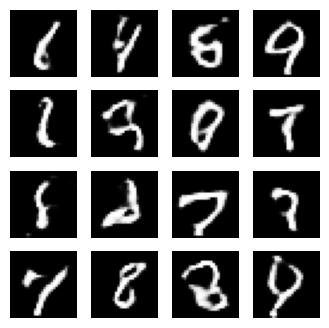

Loss in epoch 128: Generator = 216.12657165527344 , Discriminator = 294.8815612792969 


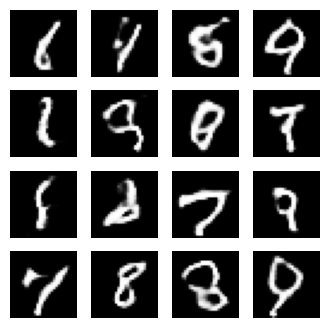

Loss in epoch 129: Generator = 215.44866943359375 , Discriminator = 293.81121826171875 


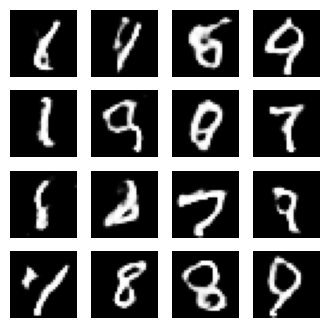

Loss in epoch 130: Generator = 212.91241455078125 , Discriminator = 294.5208435058594 


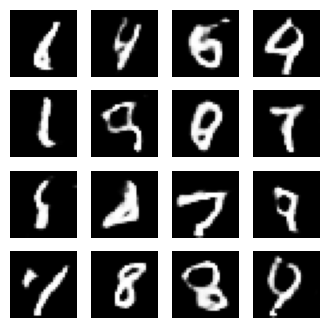

Loss in epoch 131: Generator = 218.9301300048828 , Discriminator = 292.4983825683594 


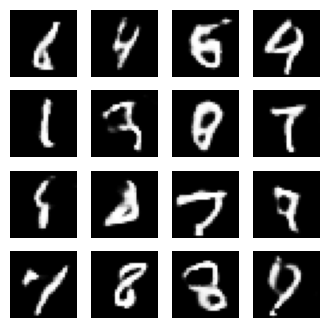

Loss in epoch 132: Generator = 214.44668579101562 , Discriminator = 295.03961181640625 


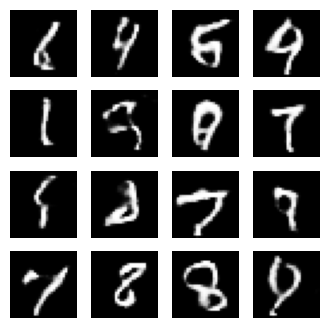

Loss in epoch 133: Generator = 212.10037231445312 , Discriminator = 295.22314453125 


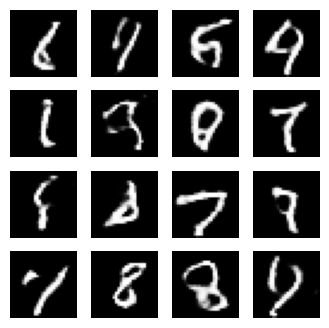

Loss in epoch 134: Generator = 211.68896484375 , Discriminator = 295.07379150390625 


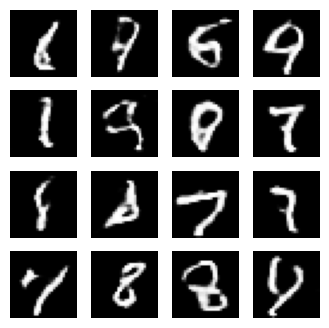

Loss in epoch 135: Generator = 216.1307373046875 , Discriminator = 294.3455810546875 


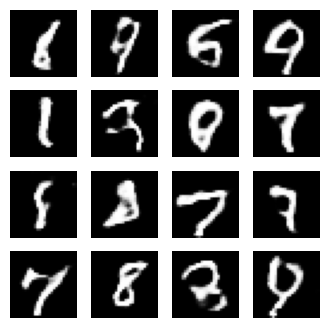

Loss in epoch 136: Generator = 219.8623809814453 , Discriminator = 294.2972717285156 


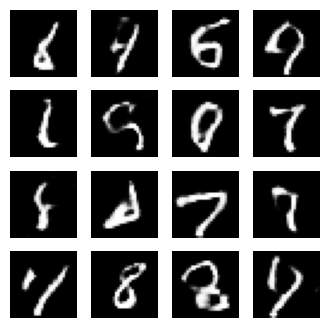

Loss in epoch 137: Generator = 221.5847625732422 , Discriminator = 293.2989501953125 


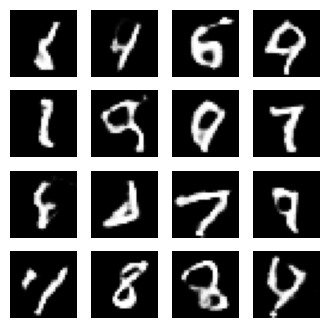

Loss in epoch 138: Generator = 223.68475341796875 , Discriminator = 292.1915283203125 


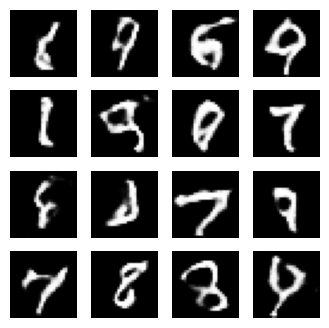

Loss in epoch 139: Generator = 216.6402587890625 , Discriminator = 295.20660400390625 


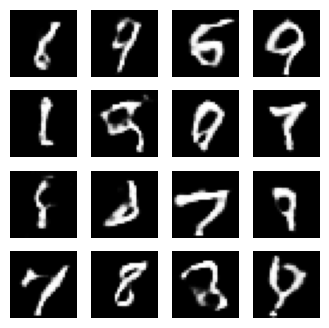

Loss in epoch 140: Generator = 218.6254425048828 , Discriminator = 293.0928649902344 


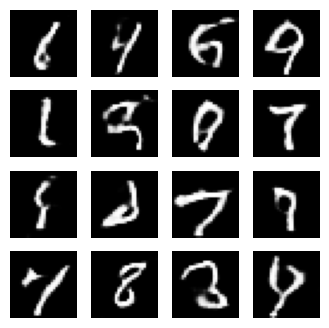

Loss in epoch 141: Generator = 218.2069854736328 , Discriminator = 297.37677001953125 


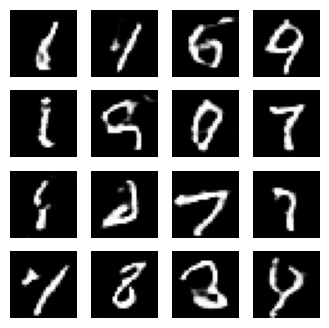

Loss in epoch 142: Generator = 215.9676055908203 , Discriminator = 294.60040283203125 


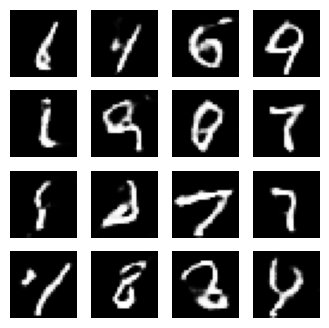

Loss in epoch 143: Generator = 211.04466247558594 , Discriminator = 296.1261901855469 


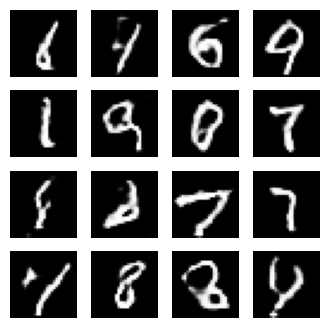

Loss in epoch 144: Generator = 209.95303344726562 , Discriminator = 294.9584045410156 


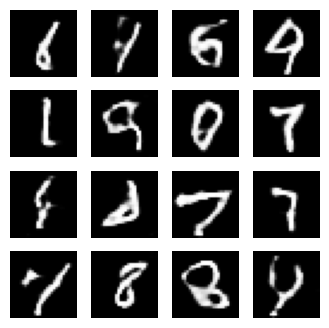

Loss in epoch 145: Generator = 208.7930908203125 , Discriminator = 298.27301025390625 


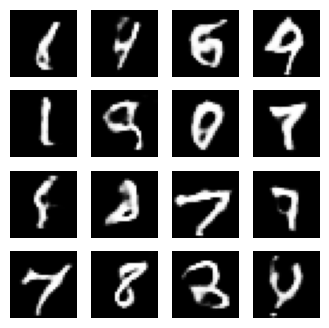

Loss in epoch 146: Generator = 216.74905395507812 , Discriminator = 294.94415283203125 


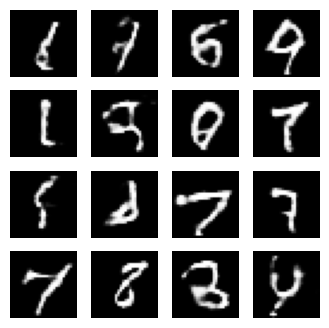

Loss in epoch 147: Generator = 218.9252166748047 , Discriminator = 296.020263671875 


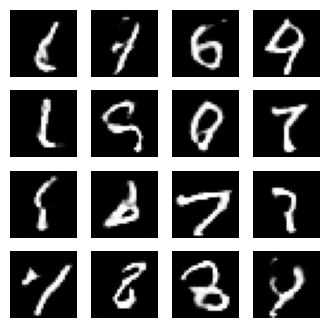

Loss in epoch 148: Generator = 216.5550994873047 , Discriminator = 294.80303955078125 


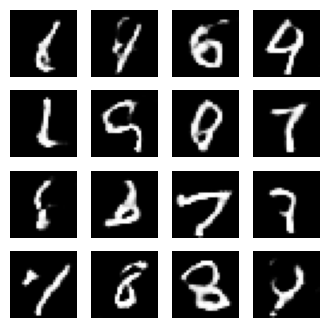

Loss in epoch 149: Generator = 214.9381561279297 , Discriminator = 296.4427795410156 


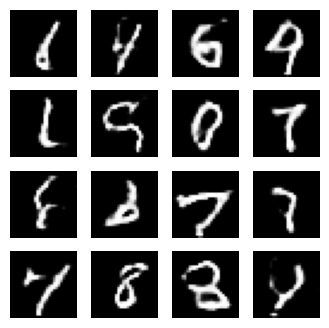

Loss in epoch 150: Generator = 215.77052307128906 , Discriminator = 295.5718688964844 


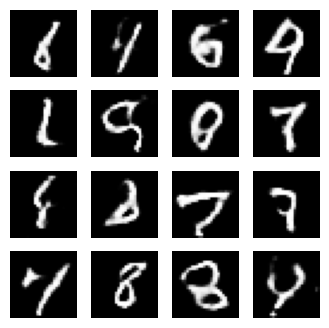

Loss in epoch 151: Generator = 216.3520965576172 , Discriminator = 297.35888671875 


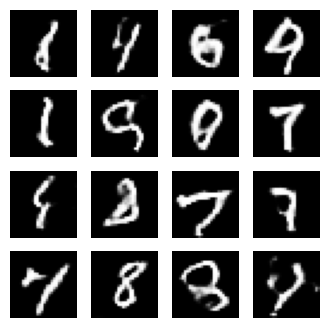

Loss in epoch 152: Generator = 216.02183532714844 , Discriminator = 293.7860107421875 


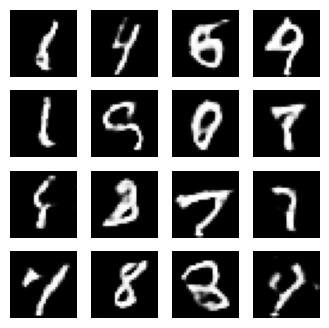

Loss in epoch 153: Generator = 211.59255981445312 , Discriminator = 295.0255126953125 


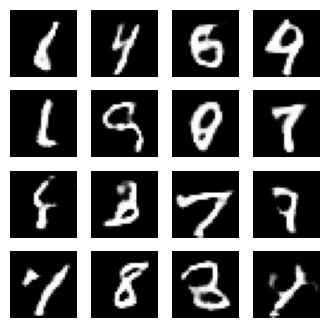

Loss in epoch 154: Generator = 214.37930297851562 , Discriminator = 295.6153259277344 


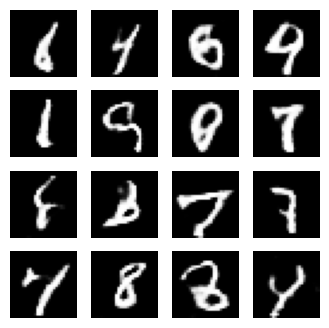

Loss in epoch 155: Generator = 212.31610107421875 , Discriminator = 297.7248229980469 


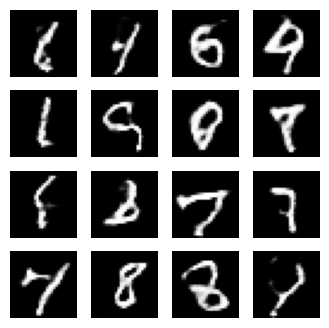

Loss in epoch 156: Generator = 209.6789093017578 , Discriminator = 297.6414794921875 


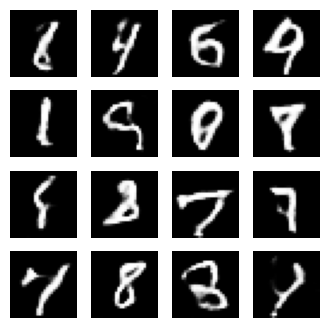

Loss in epoch 157: Generator = 209.40428161621094 , Discriminator = 297.0836486816406 


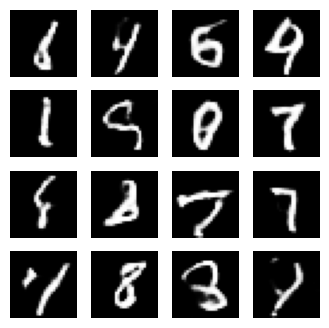

Loss in epoch 158: Generator = 207.3179473876953 , Discriminator = 299.0047302246094 


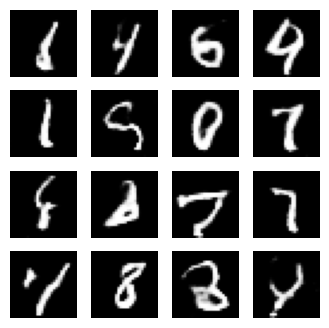

Loss in epoch 159: Generator = 213.0450439453125 , Discriminator = 296.0383605957031 


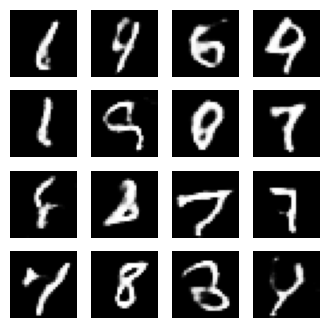

Loss in epoch 160: Generator = 217.1455078125 , Discriminator = 294.0181579589844 


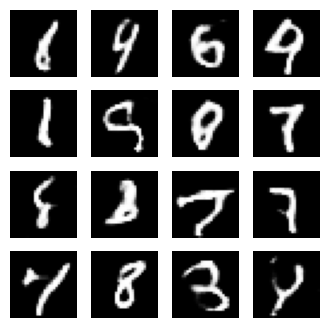

Loss in epoch 161: Generator = 224.26861572265625 , Discriminator = 296.1254577636719 


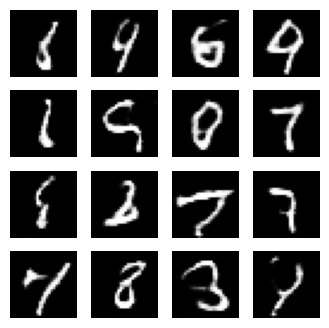

Loss in epoch 162: Generator = 217.35743713378906 , Discriminator = 294.4158630371094 


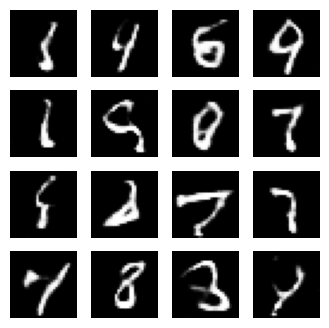

Loss in epoch 163: Generator = 215.38674926757812 , Discriminator = 296.602783203125 


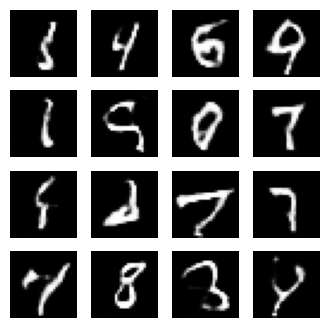

Loss in epoch 164: Generator = 209.18577575683594 , Discriminator = 297.63958740234375 


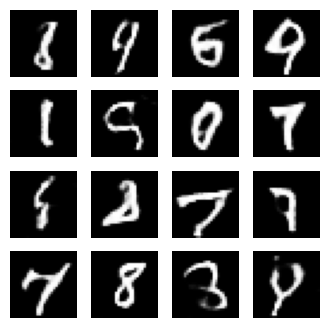

Loss in epoch 165: Generator = 209.82470703125 , Discriminator = 295.02227783203125 


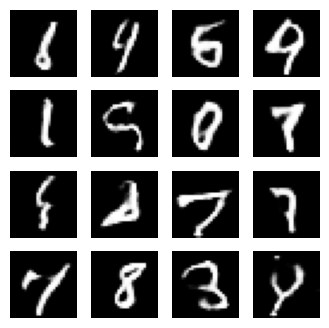

Loss in epoch 166: Generator = 209.0735626220703 , Discriminator = 298.3388366699219 


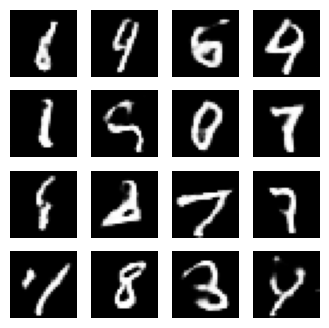

Loss in epoch 167: Generator = 210.7628173828125 , Discriminator = 298.5976257324219 


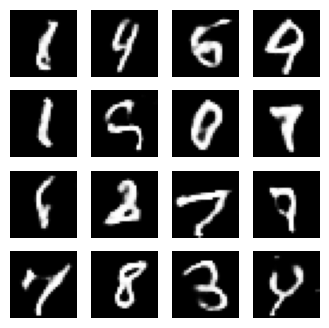

Loss in epoch 168: Generator = 208.17591857910156 , Discriminator = 299.1044616699219 


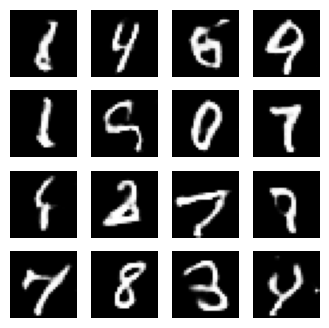

Loss in epoch 169: Generator = 210.21002197265625 , Discriminator = 297.9305419921875 


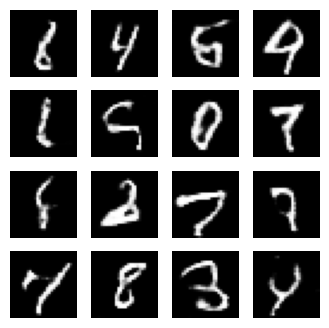

Loss in epoch 170: Generator = 218.70033264160156 , Discriminator = 295.6522216796875 


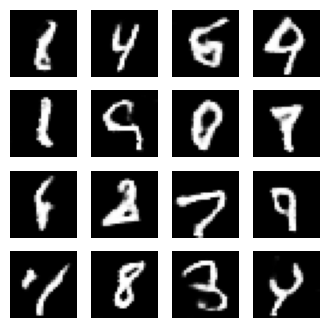

Loss in epoch 171: Generator = 213.69061279296875 , Discriminator = 297.69134521484375 


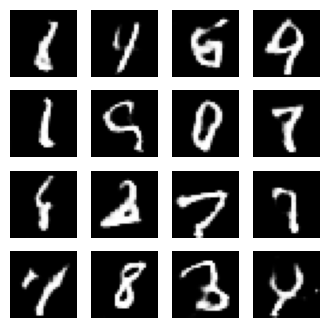

Loss in epoch 172: Generator = 214.21710205078125 , Discriminator = 296.3612976074219 


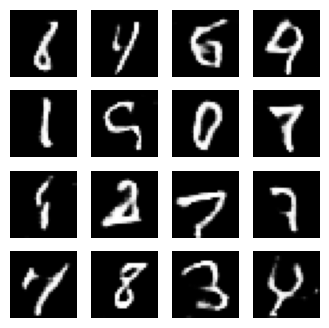

Loss in epoch 173: Generator = 211.66790771484375 , Discriminator = 301.4580383300781 


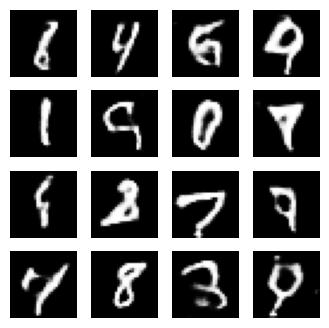

Loss in epoch 174: Generator = 215.30184936523438 , Discriminator = 295.8067626953125 


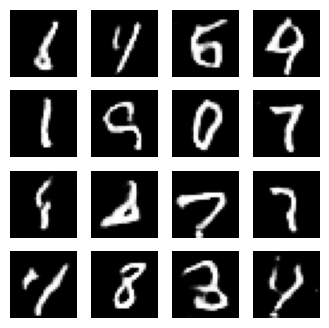

Loss in epoch 175: Generator = 214.70042419433594 , Discriminator = 297.9083557128906 


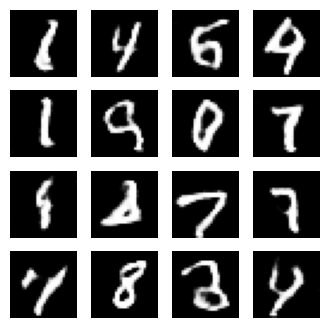

Loss in epoch 176: Generator = 216.04783630371094 , Discriminator = 295.6621398925781 


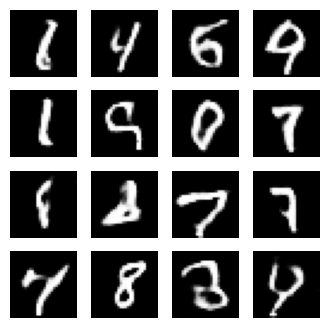

Loss in epoch 177: Generator = 215.42759704589844 , Discriminator = 298.79217529296875 


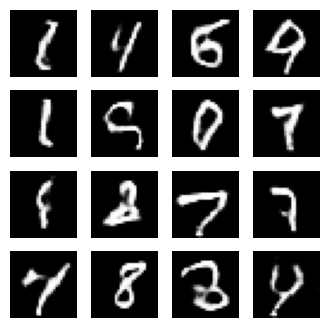

Loss in epoch 178: Generator = 211.85635375976562 , Discriminator = 297.1390686035156 


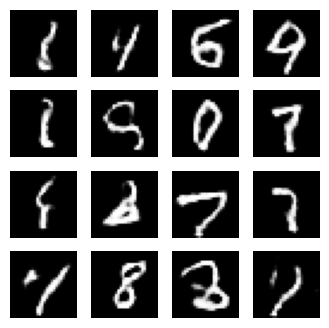

Loss in epoch 179: Generator = 209.98890686035156 , Discriminator = 296.67156982421875 


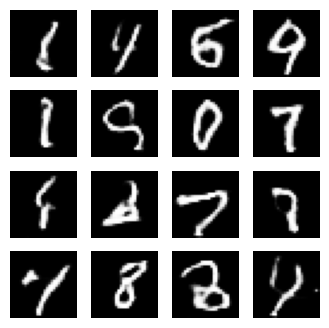

Loss in epoch 180: Generator = 207.53073120117188 , Discriminator = 299.4874572753906 


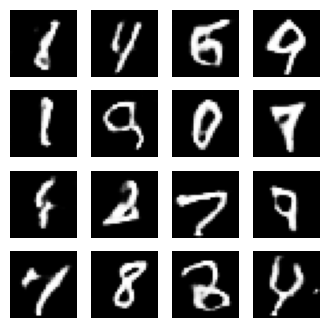

Loss in epoch 181: Generator = 206.4929656982422 , Discriminator = 300.851806640625 


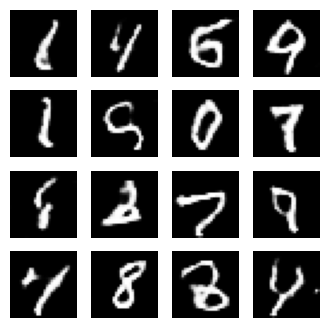

Loss in epoch 182: Generator = 209.02366638183594 , Discriminator = 297.9281005859375 


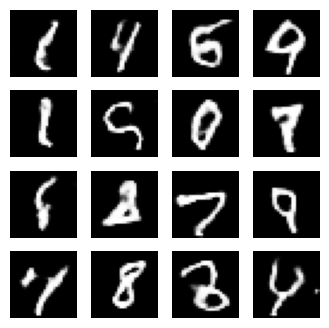

Loss in epoch 183: Generator = 210.1121063232422 , Discriminator = 297.8509826660156 


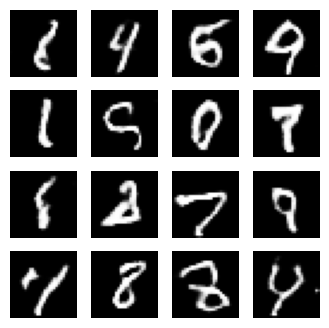

Loss in epoch 184: Generator = 211.58511352539062 , Discriminator = 299.09210205078125 


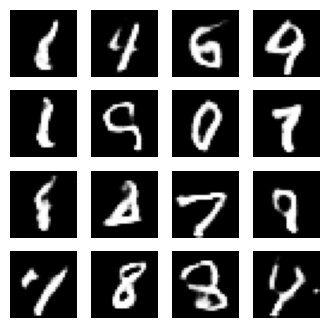

Loss in epoch 185: Generator = 217.1957550048828 , Discriminator = 298.7789001464844 


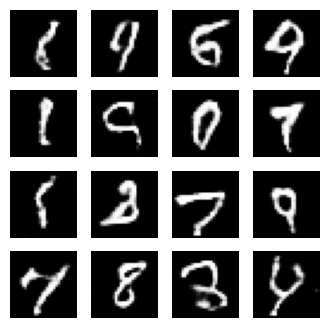

Loss in epoch 186: Generator = 216.40798950195312 , Discriminator = 294.71673583984375 


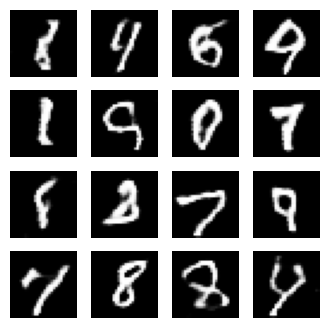

Loss in epoch 187: Generator = 211.59690856933594 , Discriminator = 298.98736572265625 


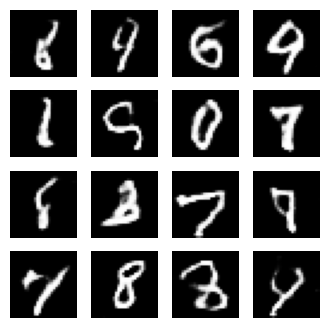

Loss in epoch 188: Generator = 209.22866821289062 , Discriminator = 298.5615539550781 


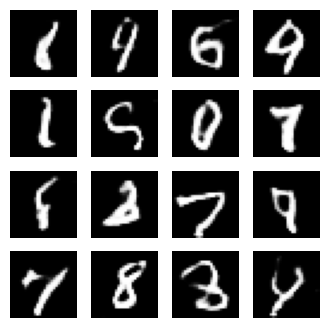

Loss in epoch 189: Generator = 209.52366638183594 , Discriminator = 299.39324951171875 


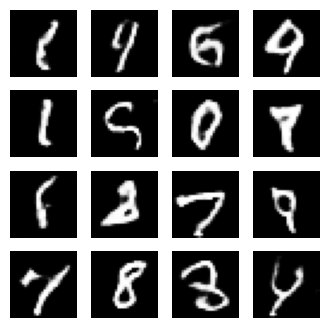

Loss in epoch 190: Generator = 209.04052734375 , Discriminator = 299.5539855957031 


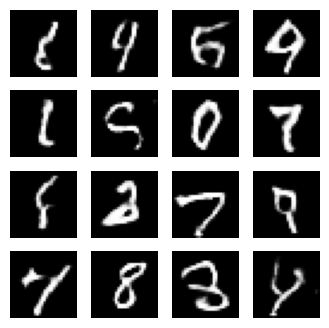

Loss in epoch 191: Generator = 213.19557189941406 , Discriminator = 299.2953186035156 


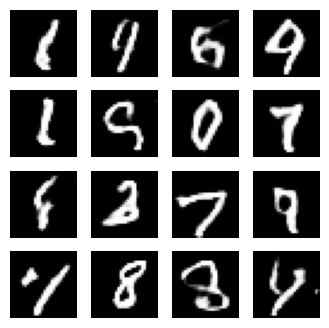

Loss in epoch 192: Generator = 213.34243774414062 , Discriminator = 296.52471923828125 


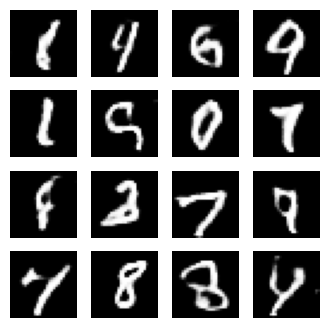

Loss in epoch 193: Generator = 216.42669677734375 , Discriminator = 297.2502746582031 


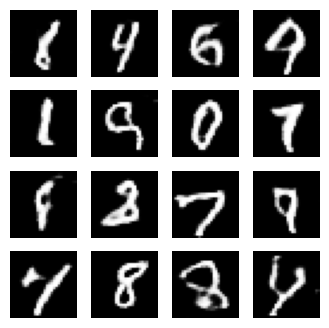

Loss in epoch 194: Generator = 212.96900939941406 , Discriminator = 297.28253173828125 


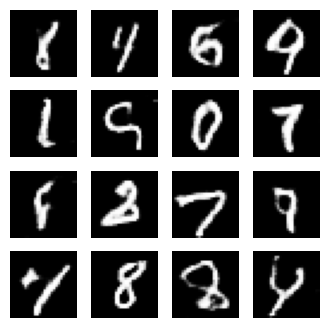

Loss in epoch 195: Generator = 211.97418212890625 , Discriminator = 298.1949768066406 


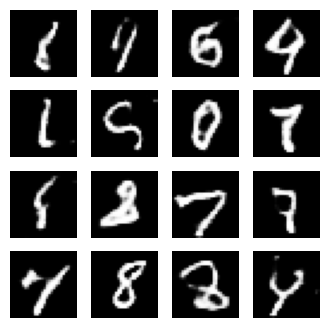

Loss in epoch 196: Generator = 211.734375 , Discriminator = 298.315185546875 


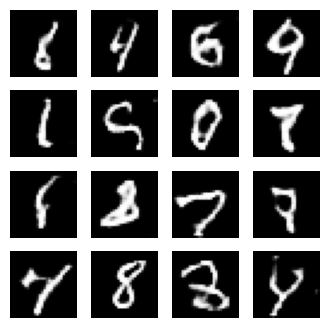

Loss in epoch 197: Generator = 207.3260040283203 , Discriminator = 299.6505126953125 


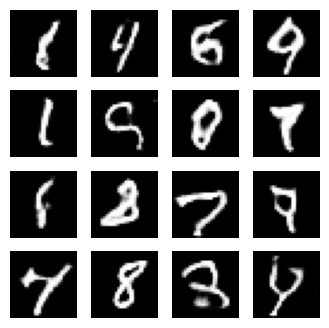

Loss in epoch 198: Generator = 203.83416748046875 , Discriminator = 299.15509033203125 


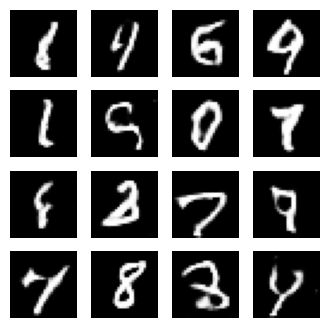

Loss in epoch 199: Generator = 204.18667602539062 , Discriminator = 301.56683349609375 


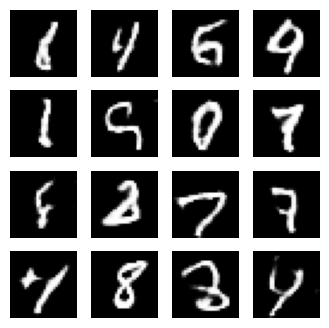

Loss in epoch 200: Generator = 207.59877014160156 , Discriminator = 298.4319152832031 


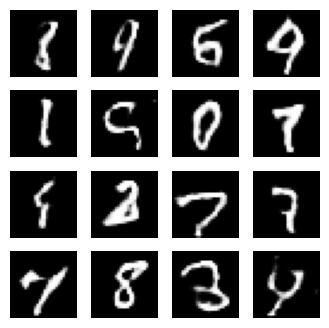

In [15]:
train_and_show_progress(train_dataset, epochs)